In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
# from geopy.distance import geodesic

from sklearn.metrics import confusion_matrix
from sklearn import linear_model, metrics, tree, ensemble, neural_network, svm
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

In [ ]:
DATADIR = '/work/datathon_2024_dataset.csv' # specify the directory to your data
stats_df = pd.read_csv(DATADIR)

# Cleaning the data:

stats_df = pd.DataFrame(stats_df)
    # convert date columns, add year,month,day columns
stats_df['game_date'] = pd.to_datetime(stats_df['game_date'], format = '%Y%m%d')
stats_df['year'] = stats_df['game_date'].dt.year
stats_df['month'] = stats_df['game_date'].dt.month
stats_df['day'] = stats_df['game_date'].dt.day

    # remove the index column
stats_df = stats_df.drop('Unnamed: 0', axis = 1)

In [ ]:
# CLASSIFY abroad or not
pd.unique(stats_df['state'])

USstates = ['GA', 'OH', 'FL', 'NY', 'MO', 'CA', 'MD', 'MN', 'TX', 'AZ', 'PA', 'WA', 'IL', 
            'CO', 'WI', 'MA', 'MI', 'PR', 'DC', 'NC', 'NE', 'IA']

def isAbroad(state): 
    if state in USstates:
        # not abroad
        return 0
    else: 
        # abroad
        return 1

stats_df['isAbroad'] = stats_df['state'].apply(isAbroad)

# how many games are played abroad
abroad_counts = stats_df['isAbroad'].value_counts()
print(abroad_counts)


0    54578
1     2197
Name: isAbroad, dtype: int64


In [ ]:
longLat_df = pd.read_csv('/work/latLong.csv')
print(longLat_df)
longLat_df.set_index('states', inplace=True)
stats_df['Latitude'] = stats_df['state'].map(longLat_df['Latitude'])
stats_df['Longitude'] = stats_df['state'].map(longLat_df['Longitude'])
print(stats_df.head())
stats_df

              full_state   Latitude   Longitude states
0                Alabama  32.806671  -86.791130     AL
1                 Alaska  61.370716 -152.404419     AK
2                Arizona  33.729759 -111.431221     AZ
3               Arkansas  34.969704  -92.373123     AR
4             California  36.116203 -119.681564     CA
5               Colorado  39.059811 -105.311104     CO
6            Connecticut  41.597782  -72.755371     CT
7               Delaware  39.318523  -75.507141     DE
8   District of Columbia  38.897438  -77.026817     DC
9                Florida  27.766279  -81.686783     FL
10               Georgia  33.040619  -83.643074     GA
11                Hawaii  21.094318 -157.498337     HI
12                 Idaho  44.240459 -114.478828     ID
13              Illinois  40.349457  -88.986137     IL
14               Indiana  39.849426  -86.258278     IN
15                  Iowa  42.011539  -93.210526     IA
16                Kansas  38.526600  -96.726486     KS
17        

,game_date,home_team,away_team,is_day_game,home_score,away_score,venue,venue_name,city,state,...,away_fo,away_so,away_bb,away_hbp,year,month,day,isAbroad,Latitude,Longitude
0,2000-03-29,NYN,CHN,False,3,5,TOK01,Tokyo Dome,Tokyo,JAP,...,24,4,3,0,2000,3,29,1,NaN,NaN
1,2000-03-30,CHN,NYN,False,1,5,TOK01,Tokyo Dome,Tokyo,JAP,...,24,9,6,0,2000,3,30,1,NaN,NaN
2,2000-04-03,ATL,COL,True,2,0,ATL02,Turner Field,Atlanta,GA,...,17,6,1,1,2000,4,3,0,33.040619,-83.643074
3,2000-04-03,CIN,MIL,True,3,3,CIN08,Cinergy Field,Cincinnati,OH,...,10,4,1,0,2000,4,3,0,40.388783,-82.764915
4,2000-04-03,FLO,SFN,False,6,4,MIA01,Sun Life Stadium,Miami,FL,...,17,7,1,1,2000,4,3,0,27.766279,-81.686783
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56770,2023-10-01,CHA,SDN,True,1,2,CHI12,Guaranteed Rate Field;U.S. Cellular Field,Chicago,IL,...,17,16,3,1,2023,10,1,0,40.349457,-88.986137
56771,2023-10-01,DET,CLE,True,5,2,DET05,Comerica Park,Detroit,MI,...,16,7,6,0,2023,10,1,0,43.326618,-84.536095
56772,2023-10-01,KCA,NYA,True,5,2,KAN06,Kauffman Stadium,Kansas City,MO,...,15,8,1,0,2023,10,1,0,38.456085,-92.288368
56773,2023-10-01,SEA,TEX,True,1,0,SEA03,Safeco Field,Seattle,WA,...,14,10,1,1,2023,10,1,0,47.400902,-121.490494


In [ ]:
# ADD countries column: 
     
def map_countries(state):
    if state in USstates:
        return "United States"
    elif state == 'JAP':
        return "Japan"
    elif state == 'QUE' or state == 'ONT':
        return "Canada"
    elif state == 'Australia':
        return "Australia"
    elif state == 'MX':
        return "Mexico"
    elif state == 'England':
        return "United Kingdom"
    # Add additional countries if needed here:
    else:
        return "Other"

stats_df['country'] = stats_df['state'].apply(map_countries)

In [ ]:
num_games_abraod = stats_df['isAbroad'].sum()
print(num_games_abraod)

2197


In [ ]:
## FIND YOUR UNIQUES: 

pd.unique(stats_df['state'])
"""
array(['JAP', 'GA', 'OH', 'FL', 'QUE', 'NY', 'MO', 'CA', 'MD', 'MN', 'TX',
       'ONT', 'AZ', 'PA', 'WA', 'IL', 'CO', 'WI', 'MA', 'MI', 'PR', 'DC',
       'Australia', 'NC', 'MX', 'NE', 'England', 'IA'], dtype=object)
"""
pd.unique(stats_df['city'])

"""
array(['Tokyo', 'Atlanta', 'Cincinnati', 'Miami', 'Montreal', 'New York',
       'St. Louis', 'Anaheim', 'Baltimore', 'Minneapolis', 'Oakland',
       'Arlington', 'Toronto', 'Phoenix', 'Pittsburgh', 'Seattle',
       'Houston', 'Kansas City', 'St. Petersburg', 'Chicago', 'Denver',
       'Milwaukee', 'Philadelphia', 'San Diego', 'San Francisco',
       'Boston', 'Detroit', 'Los Angeles', 'Cleveland', 'San Juan',
       'Washington', 'Lake Buena Vista', 'Sydney', 'Fort Bragg',
       'Williamsport', 'Monterrey', 'Omaha', 'London', 'Buffalo',
       'Dunedin', 'Dyersville'], dtype=object)
"""

# 23 unique home and away teams total
    # pd.unique(stats_df['home_team'])
    # pd.unique(stats_df['away_team'])


"\narray(['Tokyo', 'Atlanta', 'Cincinnati', 'Miami', 'Montreal', 'New York',\n       'St. Louis', 'Anaheim', 'Baltimore', 'Minneapolis', 'Oakland',\n       'Arlington', 'Toronto', 'Phoenix', 'Pittsburgh', 'Seattle',\n       'Houston', 'Kansas City', 'St. Petersburg', 'Chicago', 'Denver',\n       'Milwaukee', 'Philadelphia', 'San Diego', 'San Francisco',\n       'Boston', 'Detroit', 'Los Angeles', 'Cleveland', 'San Juan',\n       'Washington', 'Lake Buena Vista', 'Sydney', 'Fort Bragg',\n       'Williamsport', 'Monterrey', 'Omaha', 'London', 'Buffalo',\n       'Dunedin', 'Dyersville'], dtype=object)\n"

In [ ]:
# exploratory
stats_df.groupby(by='home_team')['home_score'].describe()

,count,mean,std,min,25%,50%,75%,max
home_team,,,,,,,,
ANA,1896.0,4.575422,3.040380,0.0,2.0,4.0,6.0,21.0
ARI,1893.0,4.763867,3.152690,0.0,2.0,4.0,7.0,20.0
ATL,1892.0,4.674419,3.170748,0.0,2.0,4.0,6.0,29.0
BAL,1891.0,4.550502,3.105885,0.0,2.0,4.0,6.0,23.0
BOS,1894.0,5.404963,3.448695,0.0,3.0,5.0,7.0,25.0
CHA,1893.0,4.720549,3.163879,0.0,2.0,4.0,7.0,20.0
CHN,1897.0,4.579336,3.240558,0.0,2.0,4.0,6.0,21.0
CIN,1893.0,4.635499,3.050534,0.0,2.0,4.0,6.0,20.0
CLE,1890.0,4.701058,3.181146,0.0,2.0,4.0,7.0,19.0


In [ ]:
DeepnoteChart(stats_df, """{"layer":[{"layer":[{"mark":{"clip":true,"type":"bar","color":"#4c78a8","tooltip":true},"encoding":{"x":{"sort":null,"type":"nominal","field":"home_team","scale":{"type":"linear"}},"y":{"sort":null,"type":"quantitative","field":"home_score","scale":{"type":"linear"},"format":{"type":"default","decimals":null},"aggregate":"average","formatType":"numberFormatFromNumberType"}}}]}],"title":"","config":{"legend":{}},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{}}""")

In [ ]:
# adding column saying who wins each game
# 1 if home team wins, -1 if away team wins, 0 if tie

stats_df['winner'] = 0

for i in range(len(stats_df)):
    if stats_df['home_score'][i] > stats_df['away_score'][i]:
        stats_df['winner'][i] = 1
    elif stats_df['home_score'][i] < stats_df['away_score'][i]:
        stats_df['winner'][i] = -1
    else:
        stats_df['winner'][i] = 0


/tmp/ipykernel_123/1571559030.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stats_df['winner'][i] = -1
/tmp/ipykernel_123/1571559030.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stats_df['winner'][i] = 1
/tmp/ipykernel_123/1571559030.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stats_df['winner'][i] = 0


In [ ]:
stats_df['home_won'] = 0

for i in range(len(stats_df)):
    if stats_df['winner'][i] == 1:
        stats_df['home_won'][i] = 1

print(stats_df)

/tmp/ipykernel_123/1235797433.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stats_df['home_won'][i] = 1
       game_date home_team away_team  is_day_game  home_score  away_score  \
0     2000-03-29       NYN       CHN        False           3           5   
1     2000-03-30       CHN       NYN        False           1           5   
2     2000-04-03       ATL       COL         True           2           0   
3     2000-04-03       CIN       MIL         True           3           3   
4     2000-04-03       FLO       SFN        False           6           4   
...          ...       ...       ...          ...         ...         ...   
56770 2023-10-01       CHA       SDN         True           1           2   
56771 2023-10-01       DET       CLE         True           5           2   
56772 2023

In [ ]:
## EXPORT CELL:
stats_df.to_csv('cleanedAsrtosData.csv', index=False)

In [ ]:
mlb_teams = pd.read_csv('/work/mlb_teams_info.csv')
print(mlb_teams)

   code              full_name home_state
0   ARI   Arizona Diamondbacks         AZ
1   ATL         Atlanta Braves         GA
2   BAL      Baltimore Orioles         MD
3   BOS         Boston Red Sox         MA
4   CHC           Chicago Cubs         IL
5   CHW      Chicago White Sox         IL
6   CIN        Cincinnati Reds         OH
7   CLE    Cleveland Guardians         OH
8   COL       Colorado Rockies         CO
9   DET         Detroit Tigers         MI
10  HOU         Houston Astros         TX
11  KCR     Kansas City Royals         MO
12  LAA     Los Angeles Angels         CA
13  LAD    Los Angeles Dodgers         CA
14  MIA          Miami Marlins         FL
15  MIL      Milwaukee Brewers         WI
16  MIN        Minnesota Twins         MN
17  NYM          New York Mets         NY
18  NYY       New York Yankees         NY
19  OAK      Oakland Athletics         CA
20  PHI  Philadelphia Phillies         PA
21  PIT     Pittsburgh Pirates         PA
22  SDP       San Diego Padres    

In [ ]:
# Creating dataframe for teams only

teams_df = pd.DataFrame()

teams_df['team'] = pd.unique(stats_df['home_team'])
teams_df['num_won'] = 0

for i in range(len(stats_df)):
    if stats_df['winner'][i] == 1:
        win_team = stats_df['home_team'][i]
        idx = teams_df.index[teams_df['team'] == win_team]
        teams_df.loc[idx, 'num_won'] += 1
        
    elif stats_df['winner'][i] == -1:
        win_team = stats_df['away_team'][i]
        idx = teams_df.index[teams_df['team'] == win_team]
        teams_df.loc[idx, 'num_won'] += 1


In [ ]:
# num home team wins, loses, ties
counts = stats_df['winner'].value_counts()
print(counts)

 1    30549
-1    26220
 0        6
Name: winner, dtype: int64


In [ ]:
print(stats_df.shape)
print(teams_df['num_won'].sum())

(56775, 37)
56769


In [ ]:
# column for how many games each team played total

teams_df['games_played'] = 0

for i in range(len(stats_df)):
    home = stats_df['home_team'][i]
    away = stats_df['away_team'][i]
    home_idx = teams_df.index[teams_df['team'] == home]
    away_idx = teams_df.index[teams_df['team'] == away]
    teams_df.loc[home_idx, 'games_played'] += 1
    teams_df.loc[away_idx, 'games_played'] += 1


In [ ]:
# column for percent games won

teams_df['percent_won'] = 0

for i in range(len(teams_df)):
    won = teams_df['num_won'][i]
    total = teams_df['games_played'][i]
    teams_df['percent_won'][i] = str((won / total)*100)

#print(teams_df)
print(teams_df.sort_values(by = 'percent_won'))

# MIA worst, NYA best

   team  num_won  games_played         percent_won
17  KCA     1651          3786  43.608029582673005
31  MIA      806          1840   43.80434782608696
14  PIT     1691          3782  44.711792702273925
8   BAL     1714          3786   45.27205493924987
5   MON      368           810    45.4320987654321
19  COL     1748          3787   46.15790863480328
25  DET     1755          3781  46.416291986247025
3   CIN     1784          3788    47.0960929250264
22  SDN     1795          3787  47.398996567203596
30  WAS     1439          2974   48.38601210490921
13  ARI     1833          3786   48.41521394611728
11  TEX     1859          3787   49.08898864536573
20  MIL     1867          3787  49.300237655135994
28  CHA     1870          3786   49.39249867934495
4   FLO      963          1942    49.5880535530381
18  TBA     1879          3784   49.65644820295983
1   CHN     1886          3785   49.82826948480845
0   NYN     1887          3784   49.86786469344609
15  SEA     1890          3786 

In [ ]:
head_df = teams_df.sort_values(by = 'percent_won').head(10)
tail_df = teams_df.sort_values(by = 'percent_won').tail(10)
sorted_df = pd.concat([head_df, tail_df])
sorted_df['time_zones'] = [32, 33, 35, 33, 29, 41, 35, 34, 48, 35, 34, 29, 58, 48, 52, 31, 31, 30, 50, 28]

# df = pd.read_csv('/work/was_final.csv')
# print(df)
print(sorted_df)

# nya_df = pd.read_csv('/work/col_final.csv')
# print(nya_df)
# nyn = 29
"""TOP 10"""
# nya = 28
# lan = 50
# sln = 30
# atl = 31
# bos = 31
# sfn = 52
# ana = 48
# oak = 58
# cle = 29
# hou = 34

"""WORST 10"""
# kca = 32
# mia = 33
# pit = 35
# bal = 33
# mon = 29
# col = 41
# det = 35
# cin = 34
# sdn = 48
# was = 35

   team  num_won  games_played         percent_won  time_zones
17  KCA     1651          3786  43.608029582673005          32
31  MIA      806          1840   43.80434782608696          33
14  PIT     1691          3782  44.711792702273925          35
8   BAL     1714          3786   45.27205493924987          33
5   MON      368           810    45.4320987654321          29
19  COL     1748          3787   46.15790863480328          41
25  DET     1755          3781  46.416291986247025          35
3   CIN     1784          3788    47.0960929250264          34
22  SDN     1795          3787  47.398996567203596          48
30  WAS     1439          2974   48.38601210490921          35
16  HOU     1941          3786   51.26782884310618          34
29  CLE     1954          3784    51.6384778012685          29
10  OAK     1961          3784  51.823467230443974          58
7   ANA     1971          3786   52.06022187004754          48
23  SFN     1972          3784  52.114164904862584     

'WORST 10'

In [ ]:
sorted_df = sorted_df.sort_values(by = 'percent_won', ascending=False)

Index(['team', 'num_won', 'games_played', 'percent_won', 'time_zones'], dtype='object')


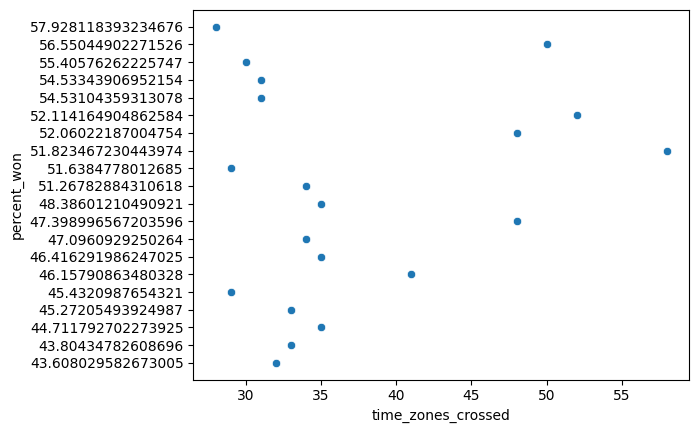

In [ ]:
data = {
    "percent_won": sorted_df['percent_won'],
    "time_zones_crossed": sorted_df['time_zones']
}

scatter = pd.DataFrame(data)

sns.scatterplot(x='time_zones_crossed', y='percent_won', data=scatter)
plt.show()

# Time Zone Calculations

In [ ]:
# find how many time zone differences each team had to jump
# find time zone of each team
# find how many times it went to a different time zone

pacific = ['ANA', 'SEA', 'OAK', 'LAD', 'LAA', 'SDN', 'SFN', 'LAN']
mountain = ['ARI', 'COL']
central = ['CHN', 'SLN', 'MIN', 'TEX', 'HOU', 'KCA', 'MIL', 'CHA']
eastern = ['ATL', 'CIN', 'FLO', 'MON', 'BAL', 'TOR', 'PIT', 'TBA', 'PHI', 'BOS', 'DET', 'NYA', 'CLE', 'WAS', 'MIA', 'NYN']

#use to populate the time zone column that shows the time zone of each game
def game_timezone(team_code): 
    if team_code in pacific:
        return 'pacific'
    if team_code in mountain: 
        return 'mountain'
    if team_code in central:
        return 'central'
    if team_code in eastern:
        return 'eastern'

# NYN = NEW YORK METS 

pacific to x:

pacific to mountain = 1 crossed

pacific to central = 2 crossed

pacific to eastern  = 3 crossed

mountain to x:

mount to pac = 1

mount to central = 1

mount to east = 2

central to x:

cent to pac = 2

cent to mount = 1

cent to east = 1

eastern to x:

east to pac = 3

east to mount = 2

east to cent = 1

In [ ]:

#adding a column that has the time zone of every game
lan_df['time_zone'] = 0
lan_df['time_zone'] = lan_df['home_team'].apply(game_timezone)
print(la#_df['time_zone'].head(20))


#Calculates the time zones crossed from the previous game to the current game
def time_zones_crossed(start_tz, end_tz):
    #format:   {starting time zone: {ending time zone : num tz crossed}}
    time_zone_dist = {'pacific' : {'pacific': 0, 'mountain' : 1,  'central' : 2, 'eastern' : 3}, 
    'mountain': {'pacific': 1, 'mountain' : 0, 'central': 1, 'eastern' : 2}, 
    'central': {'pacific' : 2, 'mountain' : 1, 'central' : 0, 'eastern' : 1}, 
    'eastern' : {'pacific' : 3, 'mountain' : 2, 'central': 1, 'eastern': 0}}
    num_tz_crossed = time_zone_dist[start_tz][end_tz]
    return num_tz_crossed

#this will populate the column with the number of time zones crossed at that point
#need to sum up the number of time zones crossed at that point. 
#also need to reset for each the time zones crossed for each season

#create the column to be populated
la_df['time_zones_crossed'] = 0

#this code makes time_zones_crossed column which has the total number of time zones crossed at that point in the 
#season. this count will reset every time there's a new season

current_year = lan_df['year'][0]
for index in range(len(lan_df)):
    curr_game_tz = lan_df['time_zone'][index]
    #for the first index or when we start a new season, we need to reset the number of time zones crossed
    #in this case, there will be no previous time zone. so, we just looked at the number of time zones they had to cross
    #to get from their home state to wherever their next game is
    if(index == 0 or (lan_df['year'][index] != current_year)):
        current_year = lan_df['year'][index]
        #the time zone of the team's home state
        #TEAM CODE MUST BE HARD CODED
        home_tz = game_timezone('LAN')
        #look at how far they travelled from their home state time zone
        num_tz_crossed = time_zones_crossed(home_tz, curr_game_tz)
        lan_df['time_zones_crossed'][index] = num_tz_crossed
    else:
        prev_game_tz = lan_df['time_zone'][index -1]
        num_tz_crossed = time_zones_crossed(prev_game_tz, curr_game_tz)
        #print(num_tz_crossed)
        prev_num_tz_crossed = lan_df['time_zones_crossed'][index-1]
        #return total tz crossed at that point
        lan_df['time_zones_crossed'][index] = num_tz_crossed
            
print(lan_df['time_zones_crossed'].head(20))

In [ ]:
#adding a column that has the time zone of every game
lan_df['time_zone'] = 0
lan_df['time_zone'] = lan_df['home_team'].apply(game_timezone)
print(lan_df['time_zone'].head(20))

NameError: name 'lan_df' is not defined

In [ ]:
# adding a column that has the number of time zones crossed at that point in the season
la_df['num_time_zones_crossed'] = 0

    # Assuming df is your DataFrame and team_code is a parameter for build_timezones_crossed_col function
la_df['num_time_zones_crossed'] = la_df.apply(lambda row: build_timezones_crossed_col(row, 'LAN'), axis=1)

#la_df['num_time_zones_crossed'] = build_timezones_crossed_col(la_df, 'LAN')

In [ ]:
# column for how many abroad games played by each team

teams_df['abroad_games'] = 0

for i in range(len(stats_df)):
    if stats_df['isAbroad'][i] == 1:
        team = stats_df['home_team'][i]
        idx = teams_df.index[teams_df['team'] == team]
        teams_df.loc[idx, 'abroad_games'] += 1

# for each code in team column:
# mlb_teams.set_index('team', inplace=True)
# for i in range(len(teams_df)): 
#     teams_df['home_state'] = mlb_teams[hm]
# teams_df['home_state'] = teams_df['team'].map(mlb_teams['home_state'])

print(teams_df)

NameError: name 'teams_df' is not defined

<AxesSubplot: >

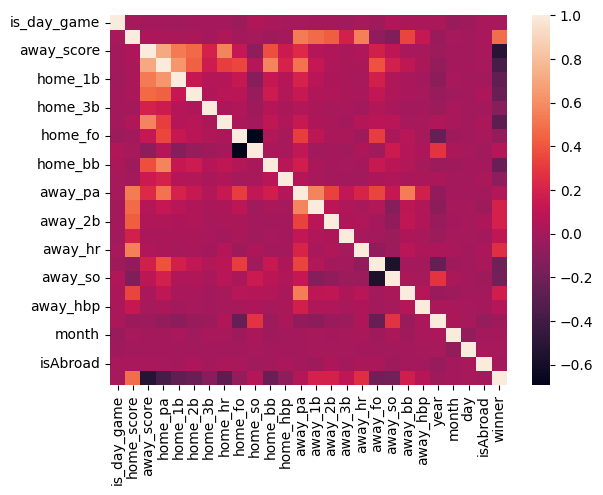

In [ ]:
sns.heatmap(stats_df.corr())

<AxesSubplot: >

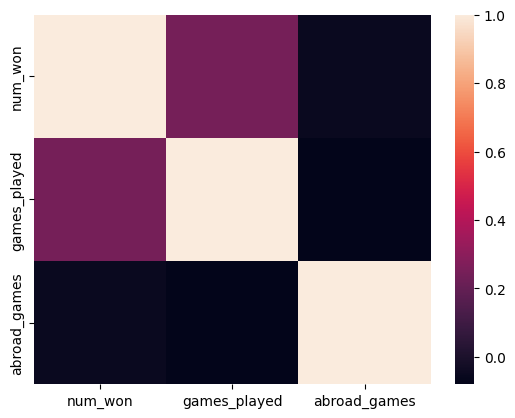

In [ ]:
sns.heatmap(teams_df.corr())

<__array_function__ internals>:180: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.


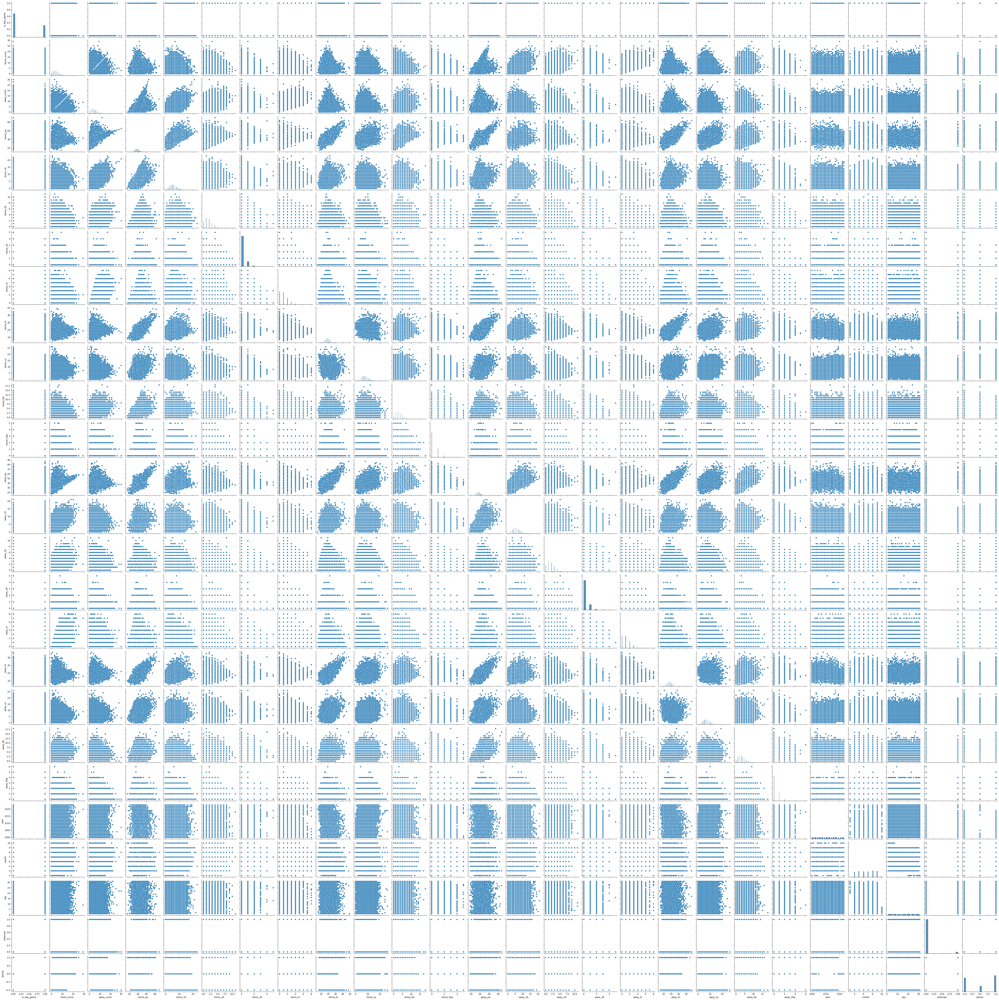

In [ ]:
sns.pairplot(stats_df)

In [ ]:
from sklearn.model_selection import train_test_split
X = 
Y = 
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.25, random_state =0, stratify = Y)

In [ ]:
la_df.shape

NameError: name 'lan_df' is not defined

# Miami

In [ ]:
DATADIR = '/work/miami.csv' # specify the directory to your data
miami_df = pd.read_csv(DATADIR)

#add the time zone for each game
miami['time_zone'] = miami_df['home_team'].apply(game_timezone)

# 

# Los Angeles

In [ ]:
# stats_df[stats_df['home_team'] == 'LAN'].head(30)

for i in range(1000):
    if stats_df['away_team'][i] == 'LAN':
        print(stats_df['home_team'][i])
        print(stats_df['away_team'][i])
        print()

MON
LAN

MON
LAN

MON
LAN

MON
LAN

NYN
LAN

NYN
LAN

SFN
LAN

SFN
LAN

SFN
LAN

CIN
LAN

CIN
LAN

CIN
LAN

NYN
LAN

ATL
LAN

ATL
LAN

ATL
LAN

ARI
LAN

ARI
LAN

ARI
LAN

SLN
LAN

SLN
LAN

SLN
LAN

CHN
LAN

CHN
LAN

FLO
LAN

FLO
LAN

FLO
LAN

ANA
LAN

ANA
LAN

ANA
LAN

TEX
LAN

TEX
LAN

TEX
LAN



In [ ]:
(stats_df['away_team'] == 'LAN').sum()
stats_df[stats_df['away_team'] == 'LAN'].head(30)


,game_date,home_team,away_team,is_day_game,home_score,away_score,venue,venue_name,city,state,...,away_hbp,year,month,day,isAbroad,Latitude,Longitude,country,winner,home_won
5,2000-04-03,MON,LAN,False,4,10,MON02,Stade Olympique,Montreal,QUE,...,0,2000,4,3,1,NaN,NaN,Canada,-1,0
18,2000-04-04,MON,LAN,False,4,10,MON02,Stade Olympique,Montreal,QUE,...,1,2000,4,4,1,NaN,NaN,Canada,-1,0
30,2000-04-05,MON,LAN,False,6,5,MON02,Stade Olympique,Montreal,QUE,...,1,2000,4,5,1,NaN,NaN,Canada,1,1
44,2000-04-06,MON,LAN,False,11,3,MON02,Stade Olympique,Montreal,QUE,...,1,2000,4,6,1,NaN,NaN,Canada,1,1
59,2000-04-07,NYN,LAN,False,2,1,NYC17,Shea Stadium,New York,NY,...,1,2000,4,7,0,42.165726,-74.948051,United States,1,1
74,2000-04-08,NYN,LAN,True,5,6,NYC17,Shea Stadium,New York,NY,...,0,2000,4,8,0,42.165726,-74.948051,United States,-1,0
110,2000-04-11,SFN,LAN,True,5,6,SFO03,Oracle Park,San Francisco,CA,...,0,2000,4,11,0,36.116203,-119.681564,United States,-1,0
124,2000-04-12,SFN,LAN,False,5,6,SFO03,Oracle Park,San Francisco,CA,...,0,2000,4,12,0,36.116203,-119.681564,United States,-1,0
138,2000-04-13,SFN,LAN,False,7,11,SFO03,Oracle Park,San Francisco,CA,...,1,2000,4,13,0,36.116203,-119.681564,United States,-1,0
234,2000-04-21,CIN,LAN,False,2,9,CIN08,Cinergy Field,Cincinnati,OH,...,0,2000,4,21,0,40.388783,-82.764915,United States,-1,0


In [ ]:
stats_df[stats_df['home_team'] == 'LAN']

,game_date,home_team,away_team,is_day_game,home_score,away_score,venue,venue_name,city,state,...,away_hbp,year,month,day,isAbroad,country,winner,home_won,Longitude,Latitude
146,2000-04-14,LAN,CIN,True,8,1,LOS03,Dodger Stadium,Los Angeles,CA,...,1,2000,4,14,0,United States,1,1,-119.681564,36.116203
160,2000-04-15,LAN,CIN,False,4,5,LOS03,Dodger Stadium,Los Angeles,CA,...,0,2000,4,15,0,United States,-1,0,-119.681564,36.116203
175,2000-04-16,LAN,CIN,True,3,5,LOS03,Dodger Stadium,Los Angeles,CA,...,1,2000,4,16,0,United States,-1,0,-119.681564,36.116203
196,2000-04-18,LAN,HOU,False,5,3,LOS03,Dodger Stadium,Los Angeles,CA,...,1,2000,4,18,0,United States,1,1,-119.681564,36.116203
210,2000-04-19,LAN,HOU,False,3,10,LOS03,Dodger Stadium,Los Angeles,CA,...,0,2000,4,19,0,United States,-1,0,-119.681564,36.116203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56620,2023-09-20,LAN,DET,False,2,4,LOS03,Dodger Stadium,Los Angeles,CA,...,0,2023,9,20,0,United States,-1,0,-119.681564,36.116203
56632,2023-09-21,LAN,SFN,False,7,2,LOS03,Dodger Stadium,Los Angeles,CA,...,0,2023,9,21,0,United States,1,1,-119.681564,36.116203
56642,2023-09-22,LAN,SFN,False,1,5,LOS03,Dodger Stadium,Los Angeles,CA,...,0,2023,9,22,0,United States,-1,0,-119.681564,36.116203
56657,2023-09-23,LAN,SFN,False,7,0,LOS03,Dodger Stadium,Los Angeles,CA,...,0,2023,9,23,0,United States,1,1,-119.681564,36.116203


In [ ]:
stats_df[stats_df['away_team'] == 'LAN']

,game_date,home_team,away_team,is_day_game,home_score,away_score,venue,venue_name,city,state,...,away_hbp,year,month,day,isAbroad,country,winner,home_won,Longitude,Latitude
5,2000-04-03,MON,LAN,False,4,10,MON02,Stade Olympique,Montreal,QUE,...,0,2000,4,3,1,Canada,-1,0,NaN,NaN
18,2000-04-04,MON,LAN,False,4,10,MON02,Stade Olympique,Montreal,QUE,...,1,2000,4,4,1,Canada,-1,0,NaN,NaN
30,2000-04-05,MON,LAN,False,6,5,MON02,Stade Olympique,Montreal,QUE,...,1,2000,4,5,1,Canada,1,1,NaN,NaN
44,2000-04-06,MON,LAN,False,11,3,MON02,Stade Olympique,Montreal,QUE,...,1,2000,4,6,1,Canada,1,1,NaN,NaN
59,2000-04-07,NYN,LAN,False,2,1,NYC17,Shea Stadium,New York,NY,...,1,2000,4,7,0,United States,1,1,-74.948051,42.165726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56704,2023-09-27,COL,LAN,False,2,8,DEN02,Coors Field,Denver,CO,...,0,2023,9,27,0,United States,-1,0,-105.311104,39.059811
56720,2023-09-28,COL,LAN,False,14,5,DEN02,Coors Field,Denver,CO,...,0,2023,9,28,0,United States,1,1,-105.311104,39.059811
56735,2023-09-29,SFN,LAN,False,2,6,SFO03,Oracle Park,San Francisco,CA,...,0,2023,9,29,0,United States,-1,0,-119.681564,36.116203
56751,2023-09-30,SFN,LAN,False,2,1,SFO03,Oracle Park,San Francisco,CA,...,0,2023,9,30,0,United States,1,1,-119.681564,36.116203


In [ ]:
# Team Advika - LA Dodgers

lan_df = pd.DataFrame()
lan_df['date'] = ""
lan_df['home'] = ""
lan_df['away'] = ""
lan_df['day_game'] = ""

def count_wins(stats_df, team, team_df):
    """
    This function counts how many wins the team has
    """
    team_df['wins'] = 0
    idx = 0

    for i in range(len(stats_df)):
        if stats_df['home_team'][i] == team:
            if stats_df['home_score'][i] > stats_df['away_score'][i]:
                team_df['wins'][idx] = 1
            idx += 1
        elif stats_df['away_team'][i] == team:
            if stats_df['home_score'][i] < stats_df['away_score'][i]:
                team_df['wins'][idx] = 1
            idx += 1

    return team_df

for i in range(len(stats_df)):
    if stats_df['home_team'][i] == 'LAN' or stats_df['away_team'][i] == 'LAN':
        lan_df = lan_df.append({
            'date': stats_df['game_date'][i].strftime('%Y-%m-%d'),
            'home': stats_df['home_team'][i],
            'away': stats_df['away_team'][i],
            'day_game': stats_df['is_day_game'][i],
        }, ignore_index=True)

count_wins(stats_df, 'LAN', lan_df)

print(lan_df)

/tmp/ipykernel_123/1397033268.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_df['wins'][idx] = 1
/tmp/ipykernel_123/1397033268.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_df['wins'][idx] = 1
            date home away day_game  wins
0     2000-04-03  MON  LAN    False     1
1     2000-04-04  MON  LAN    False     1
2     2000-04-05  MON  LAN    False     0
3     2000-04-06  MON  LAN    False     0
4     2000-04-07  NYN  LAN    False     0
...          ...  ...  ...      ...   ...
3781  2023-09-27  COL  LAN    False     1
3782  2023-09-28  COL  LAN    False     0
3783  2023-09-29  SFN  LAN    Fa

In [ ]:
distance_df = pd.read_csv('/work/Lan_final.csv')
print(distance_df)

      Unnamed: 0  Unnamed: 0.1   game_date home_team away_team  is_day_game  \
0              0             0  2000-04-03       MON       LAN        False   
1              1             1  2000-04-04       MON       LAN        False   
2              2             2  2000-04-05       MON       LAN        False   
3              3             3  2000-04-06       MON       LAN        False   
4              4             4  2000-04-07       NYN       LAN        False   
...          ...           ...         ...       ...       ...          ...   
3781        3781          3781  2023-09-27       COL       LAN        False   
3782        3782          3782  2023-09-28       COL       LAN        False   
3783        3783          3783  2023-09-29       SFN       LAN        False   
3784        3784          3784  2023-09-30       SFN       LAN        False   
3785        3785          3785  2023-10-01       SFN       LAN         True   

      home_score  away_score  venue       venue_nam

In [ ]:
lan_df['distance'] = distance_df['distance']
lan_df['time_zones'] = distance_df['time_zones_crossed']
print(lan_df)

            date home away day_game  wins  distance  time_zones
0     2000-04-03  MON  LAN    False     1      3513           3
1     2000-04-04  MON  LAN    False     1      3513           3
2     2000-04-05  MON  LAN    False     0      3513           3
3     2000-04-06  MON  LAN    False     0      3513           3
4     2000-04-07  NYN  LAN    False     0       395           3
...          ...  ...  ...      ...   ...       ...         ...
3781  2023-09-27  COL  LAN    False     1      1309          49
3782  2023-09-28  COL  LAN    False     0      1309          49
3783  2023-09-29  SFN  LAN    False     1      1309          50
3784  2023-09-30  SFN  LAN    False     0      1309          50
3785  2023-10-01  SFN  LAN     True     1      1309          50

[3786 rows x 7 columns]


In [ ]:
lan_df['time_zones'].head(50)

0      3
1      3
2      3
3      3
4      3
5      3
6      6
7      6
8      6
9      6
10     6
11     6
12     6
13     6
14     9
15     9
16     9
17     9
18     9
19     9
20     9
21    12
22    12
23    12
24    12
25    12
26    12
27    12
28    12
29    12
30    13
31    13
32    13
33    14
34    14
35    14
36    14
37    14
38    15
39    15
40    15
41    18
42    18
43    18
44    18
45    18
46    18
47    18
48    18
49    18
Name: time_zones, dtype: int64

In [ ]:
lan_df['wins'].head(50)

0     1
1     1
2     0
3     0
4     0
5     1
6     1
7     1
8     1
9     1
10    0
11    0
12    1
13    0
14    1
15    1
16    1
17    0
18    0
19    0
20    0
21    1
22    1
23    1
24    0
25    0
26    1
27    1
28    1
29    0
30    0
31    0
32    0
33    1
34    1
35    0
36    1
37    1
38    1
39    1
40    1
41    1
42    0
43    0
44    1
45    0
46    0
47    1
48    0
49    1
Name: wins, dtype: int64

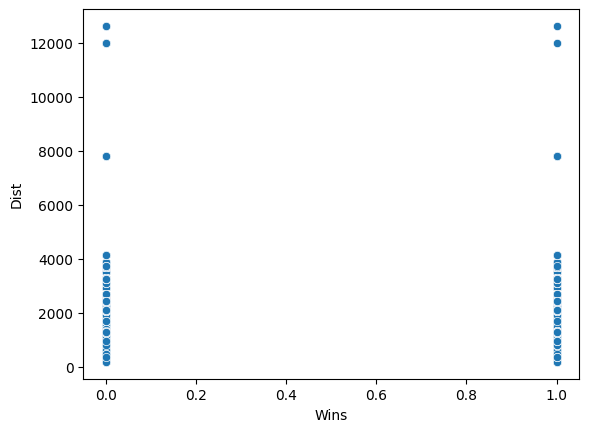

In [ ]:
data = {
    "Dist": lan_df['distance'], 
    "Wins": lan_df['wins']}
scatter_df = pd.DataFrame(data)

sns.scatterplot(x='Wins', y='Dist', data=scatter_df)
plt.show()

## Modeling

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB

models = {}
models['Naive Bayes'] = GaussianNB()
models['Decision Trees'] = DecisionTreeClassifier()
models['Random Forest'] = RandomForestClassifier()

In [ ]:
mia_df = pd.read_csv('/work/Mia_final.csv')
columns_to_keep = ['home_team', 'away_team', 'is_day_game', 'distance', 'time_zones_crossed']
mia_df_new = mia_df.loc[:, columns_to_keep]

count_wins(stats_df, 'MIA', mia_df_new)
print(mia_df_new)


/tmp/ipykernel_123/1397033268.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_df['wins'][idx] = 1
/tmp/ipykernel_123/1397033268.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_df['wins'][idx] = 1
     home_team away_team  is_day_game  distance  time_zones_crossed  wins
0          MIA       SLN        False      3684                   3     0
1          CIN       MIA         True      1403                   3     0
2          CIN       MIA        False      1403                   3     1
3          CIN       MIA         True      1403                   3     0
4          PHI       MIA         True   

In [ ]:
hou_df = pd.read_csv('/work/Hou_final.csv')
columns_to_keep = ['home_team', 'away_team', 'is_day_game', 'distance', 'time_zones_crossed']
hou_df_new = hou_df.loc[:, columns_to_keep]

count_wins(stats_df, 'HOU', hou_df_new)
print(hou_df_new)


     home_team away_team  is_day_game  distance  time_zones_crossed
0          PIT       HOU        False      3709                   3
1          PIT       HOU        False      3709                   3
2          PIT       HOU         True      3709                   3
3          HOU       PHI        False      2114                   4
4          HOU       PHI         True      2114                   4
...        ...       ...          ...       ...                 ...
3781       SEA       HOU        False      2729                  34
3782       SEA       HOU        False      2729                  34
3783       ARI       HOU        False      1737                  35
3784       ARI       HOU        False      1737                  35
3785       ARI       HOU         True      1737                  35

[3786 rows x 5 columns]
/tmp/ipykernel_123/1397033268.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documen

In [ ]:
print(mia_df_new)
X = mia_df_new.drop(columns = ['home_team', 'away_team', 'wins']).head(161)
y = mia_df_new['wins'].head(161)

print(X)
print(X.shape)

     home_team away_team  is_day_game  distance  time_zones_crossed  wins
0          MIA       SLN        False      3684                   3     0
1          CIN       MIA         True      1403                   3     0
2          CIN       MIA        False      1403                   3     1
3          CIN       MIA         True      1403                   3     0
4          PHI       MIA         True       471                   3     1
...        ...       ...          ...       ...                 ...   ...
1835       NYN       MIA        False      1710                  33     1
1836       NYN       MIA         True      1710                  33     0
1837       PIT       MIA        False       257                  33     1
1838       PIT       MIA        False       257                  33     1
1839       PIT       MIA         True       257                  33     0

[1840 rows x 6 columns]
     is_day_game  distance  time_zones_crossed
0          False      3684              

In [ ]:
print(hou_df_new)
X = hou_df_new.drop(columns = ['home_team', 'away_team', 'wins']).head(161)
y = hou_df_new['wins'].head(161)

print(X)
print(X.shape)

     home_team away_team  is_day_game  distance  time_zones_crossed  wins
0          PIT       HOU        False      3709                   3     1
1          PIT       HOU        False      3709                   3     1
2          PIT       HOU         True      3709                   3     0
3          HOU       PHI        False      2114                   4     0
4          HOU       PHI         True      2114                   4     1
...        ...       ...          ...       ...                 ...   ...
3781       SEA       HOU        False      2729                  34     0
3782       SEA       HOU        False      2729                  34     1
3783       ARI       HOU        False      1737                  35     1
3784       ARI       HOU        False      1737                  35     1
3785       ARI       HOU         True      1737                  35     1

[3786 rows x 6 columns]
     is_day_game  distance  time_zones_crossed
0          False      3709              

In [ ]:
print(lan_df)
X = lan_df.drop(columns = ['date', 'home', 'away', 'wins']).tail(161)
y = lan_df['wins'].tail(161)

print(X)
print(X.shape)
print((lan_df['wins'] == 1).sum())

            date home away day_game  wins  distance  time_zones
0     2000-04-03  MON  LAN    False     1      3513           3
1     2000-04-04  MON  LAN    False     1      3513           3
2     2000-04-05  MON  LAN    False     0      3513           3
3     2000-04-06  MON  LAN    False     0      3513           3
4     2000-04-07  NYN  LAN    False     0       395           3
...          ...  ...  ...      ...   ...       ...         ...
3781  2023-09-27  COL  LAN    False     1      1309          49
3782  2023-09-28  COL  LAN    False     0      1309          49
3783  2023-09-29  SFN  LAN    False     1      1309          50
3784  2023-09-30  SFN  LAN    False     0      1309          50
3785  2023-10-01  SFN  LAN     True     1      1309          50

[3786 rows x 7 columns]
     day_game  distance  time_zones
3625    False       798           0
3626    False       798           0
3627     True       798           0
3628    False       798           0
3629    False       798    

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=0.2, random_state=0)

In [ ]:
X_test.value_counts()

day_game  distance  time_zones
False     1262      48            3
          2123      34            3
          3684      18            2
          2433      14            2
                    28            2
          3709      8             1
True      3709      8             1
          3242      39            1
                    21            1
          998       5             1
          798       1             1
          614       15            1
False     4159      42            1
          3880      31            1
          3709      24            1
          378       31            1
          3684      45            1
          471       21            1
          3242      39            1
                    21            1
          2697      12            1
          1309      50            1
          798       36            1
                    35            1
                    1             1
True      4159      42            1
dtype: int64

In [ ]:
from sklearn.preprocessing import StandardScaler

ss_train = StandardScaler()
X_train = ss_train.fit_transform(X_train)

ss_test = StandardScaler()
X_test = ss_test.fit_transform(X_test)

In [ ]:
from sklearn.metrics import confusion_matrix

# KNN
model = KNeighborsClassifier(n_neighbors=10) 

accuracy, precision, recall = {}, {}, {}

# Fit classifier
model.fit(X_train, y_train)

# Make predictions
y_probabilities = model.predict_proba(X_test)[:, 1]
threshold = 0.4
predictions = (y_probabilities >= threshold).astype(int)
    
# Calculate metrics
accuracy['K-Nearest Neighbor'] = accuracy_score(predictions, y_test)
precision['K-Nearest Neighbor'] = precision_score(predictions, y_test)
recall['K-Nearest Neighbor'] = recall_score(predictions, y_test)

print(f"K-Nearest Neighbor Metrics:")
print(f"Accuracy: {accuracy['K-Nearest Neighbor']}")
print(f"Precision: {precision['K-Nearest Neighbor']}")
print(f"Recall: {recall['K-Nearest Neighbor']}")

print(f"Confusion Matrix for KNN:")
print(confusion_matrix(y_test, predictions))
print()

cm = confusion_matrix(y_test, predictions)

TN, FP, FN, TP = confusion_matrix(y_test, predictions).ravel()

print('True Positive(TP)  = ', TP)
print('False Positive(FP) = ', FP)
print('True Negative(TN)  = ', TN)
print('False Negative(FN) = ', FN)

accuracy =  (TP + TN) / (TP + FP + TN + FN)

print('Accuracy of the binary classifier = {:0.3f}'.format(accuracy))

K-Nearest Neighbor Metrics:
Accuracy: 0.6666666666666666
Precision: 0.9523809523809523
Recall: 0.6666666666666666
Confusion Matrix for KNN:
[[ 2 10]
 [ 1 20]]

True Positive(TP)  =  20
False Positive(FP) =  10
True Negative(TN)  =  2
False Negative(FN) =  1
Accuracy of the binary classifier = 0.667


In [ ]:
X = lan_df.drop(columns = ['date', 'home', 'away', 'wins']).head(161)
y = lan_df['wins'].head(161)

X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=0.3, random_state=0)



In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
from sklearn.model_selection import train_test_split

# Logistic Regression
model = LogisticRegression()

param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100], 'solver': ['liblinear', 'newton-cg', 'lbfgs']}
grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_

# Make predictions
predictions = best_model.predict(X_test)

# Calculate metrics
accuracy = accuracy_score(y_test, predictions)
precision = precision_score(y_test, predictions)
recall = recall_score(y_test, predictions)

# Print metrics
print(f"Logistic Regression Metrics:")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

# Confusion Matrix
print(f"Confusion Matrix for Logistic Regression:")
print(confusion_matrix(y_test, predictions))

print("\n")

from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, predictions)

TN, FP, FN, TP = confusion_matrix(y_test, predictions).ravel()

print('True Positive(TP)  = ', TP)
print('False Positive(FP) = ', FP)
print('True Negative(TN)  = ', TN)
print('False Negative(FN) = ', FN)

accuracy =  (TP + TN) / (TP + FP + TN + FN)

print('Accuracy of the binary classifier = {:0.3f}'.format(accuracy))



Logistic Regression Metrics:
Accuracy: 0.6363636363636364
Precision: 0.6363636363636364
Recall: 1.0
Confusion Matrix for Logistic Regression:
[[ 0 12]
 [ 0 21]]


True Positive(TP)  =  21
False Positive(FP) =  12
True Negative(TN)  =  0
False Negative(FN) =  0
Accuracy of the binary classifier = 0.636


In [ ]:
# SVM
model = LinearSVC(max_iter=100000000)

param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

best_lin_svm_model = grid_search.best_estimator_

test_predictions = best_lin_svm_model.predict(X_test)

accuracy = accuracy_score(test_predictions, y_test)
precision = precision_score(test_predictions, y_test)
recall = recall_score(test_predictions, y_test)

print(f"Support Vector Machines Metrics:")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

print(f"Confusion Matrix for Support Vector Machines:")
print(confusion_matrix(y_test, predictions))

print("\n")

Support Vector Machines Metrics:
Accuracy: 0.5757575757575758
Precision: 0.8095238095238095
Recall: 0.6296296296296297
Confusion Matrix for Support Vector Machines:
[[ 0 12]
 [ 0 21]]




In [ ]:

accuracy, precision, recall = {}, {}, {}
X_train, y_train = SMOTE(random_state=1).fit_resample(X_train, y_train)

for key in models.keys():
    
    # Fit the classifier
    models[key].fit(X_train, y_train)
    
    # Make predictions
    predictions = models[key].predict(X_test)
    
    # Calculate metrics
    accuracy[key] = accuracy_score(predictions, y_test)
    precision[key] = precision_score(predictions, y_test)
    recall[key] = recall_score(predictions, y_test)

    print(f"{key} Metrics:")
    print(f"Accuracy: {accuracy[key]}")
    print(f"Precision: {precision[key]}")
    print(f"Recall: {recall[key]}")

    print(f"Confusion Matrix for {key}:")
    print(confusion_matrix(y_test, predictions))
    print("\n")

Decision Trees Metrics:
Accuracy: 0.6060606060606061
Precision: 0.5714285714285714
Recall: 0.75
Confusion Matrix for Decision Trees:
[[ 8  4]
 [ 9 12]]


Random Forest Metrics:
Accuracy: 0.6363636363636364
Precision: 0.6666666666666666
Recall: 0.7368421052631579
Confusion Matrix for Random Forest:
[[ 7  5]
 [ 7 14]]


Naive Bayes Metrics:
Accuracy: 0.5454545454545454
Precision: 0.7619047619047619
Recall: 0.6153846153846154
Confusion Matrix for Naive Bayes:
[[ 2 10]
 [ 5 16]]




In [ ]:
accuracy['Support Vector Machines'] = 0.5757575757575758
precision['Support Vector Machines'] = 0.8095238095238095
recall['Support Vector Machines'] = 0.6296296296296297

accuracy['Logistic Regression'] = 0.6363636363636364
precision['Logistic Regression'] = 0.6363636363636364
recall['Logistic Regression'] = 1.0

accuracy['KNN'] = 0.6666666666666666
precision['KNN'] = 0.9523809523809523
recall['KNN'] = 0.6666666666666666

In [ ]:
df_model = pd.DataFrame(index=['Decision Trees', 'Random Forest', 'Naive Bayes', 'Support Vector Machines', 'Logistic Regression', 'KNN'], columns=['Accuracy', 'Precision', 'Recall'])
df_model['Accuracy'] = accuracy.values()
df_model['Precision'] = precision.values()
df_model['Recall'] = recall.values()

df_model

,Accuracy,Precision,Recall
Decision Trees,0.606061,0.571429,0.750000
Random Forest,0.636364,0.666667,0.736842
Naive Bayes,0.545455,0.761905,0.615385
Support Vector Machines,0.575758,0.809524,0.629630
Logistic Regression,0.636364,0.636364,1.000000
KNN,0.666667,0.952381,0.666667


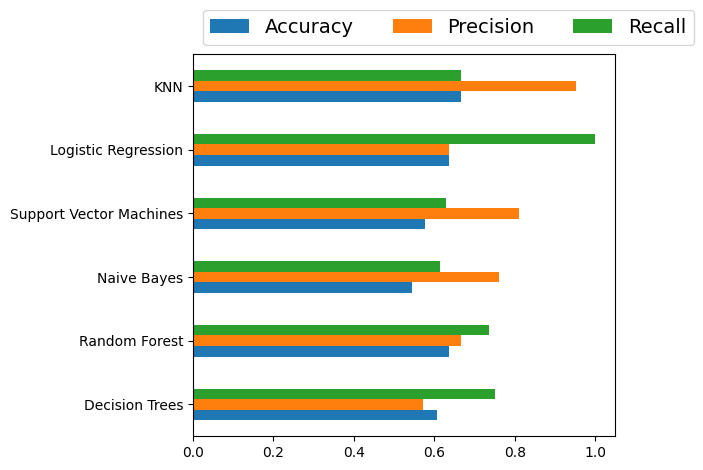

In [ ]:
ax = df_model.plot.barh()
ax.legend(
    ncol=len(models.keys()), 
    bbox_to_anchor=(0, 1), 
    loc='lower left', 
    prop={'size': 14}
)
plt.tight_layout()

In [ ]:
print(stats_df)

NameError: name 'lan_df' is not defined

In [ ]:
print(pd.unique(stats_df['state']))


cities = ['New York', 'San Francisco', 'Los Angeles', 'Cincinnati', 'Atlanta', 'Phoenix', 'St. Louis', 'Chicago',
'Miami', 'Anaheim', 'Arlington', 'Houston', 'San Diego', 'Seattle', 'Denver', 'Philadelphia', 'Pittsburgh',
'Milwaukee']
connections = [('New York', 'San Francisco'), ('San Francisco', 'Los Angeles'), 
('Los Angeles', 'Cincinnati'), ('Cincinnati', 'New York'), ('New York', 'Atlanta'), ('Atlanta', 'Los Angeles'), 
('Los Angeles', 'Phoenix'), ('Phoenix', 'St. Louis'), ('St. Louis', 'Chicago'), ('Chicago', 'Miami'), ('Miami', 'Los Angeles'), 
('Los Angeles', 'Anaheim'), ('Anaheim', 'Arlington'), ('Arlington', 'Los Angeles'), ('Los Angeles', 'Houston'),
('Houston', 'St. Louis'), ('St. Louis', 'Los Angeles'), ('Los Angeles', 'San Francisco'), ('San Francisco', 'San Diego'),
('San Diego', 'Seattle'), ('Seattle', 'Los Angeles'), ('Los Angeles', 'Denver'), ('Denver', 'Philadelphia'),
('Philadelphia', 'Pittsburgh'), ('Pittsburgh', 'Los Angeles'), ('Los Angeles', 'Atlanta'), ('Atlanta', 'Miami'),
('Miami', 'Los Angeles'), ('Los Angeles', 'Chicago'), ('Chicago', 'Milwaukee'), ('Milwaukee', 'Los Angeles'), 
('Los Angeles', 'Denver'), ('Denver', 'Phoenix'), ('Phoenix', 'Los Angeles'), ('Los Angeles', 'San Diego')]

['JAP' 'GA' 'OH' 'FL' 'QUE' 'NY' 'MO' 'CA' 'MD' 'MN' 'TX' 'ONT' 'AZ' 'PA'
 'WA' 'IL' 'CO' 'WI' 'MA' 'MI' 'PR' 'DC' 'Australia' 'NC' 'MX' 'NE'
 'England' 'IA']


In [ ]:
import geopandas as gpd
import networkx as nx

# Example data: states, sizes, and connections
cities_data = {'city': cities,
               'size': [2, 2, 10, 1, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 2, 1, 1, 1]}

# Create a GeoDataFrame with state geometries
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
states_gdf = world[world['name'].isin(cities_data['city'])]

# Create a graph
G = nx.Graph()

# Add nodes and sizes
for state, size in zip(cities_data['city'], cities_data['size']):
    G.add_node(state, size=size)

# Add edges
G.add_edges_from(connections)

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))
states_gdf.plot(ax=ax, color='lightgray', edgecolor='black')

# Plot nodes with different sizes
pos = {state: (lng, lat) for state, (lng, lat) in zip(states_gdf['name'], zip(states_gdf['geometry'].centroid.x, states_gdf['geometry'].centroid.y))}
sizes = [G.nodes[state]['size'] for state in G.nodes]
nx.draw_networkx_nodes(G, pos, node_size=sizes, node_color='blue', alpha=0.7)

# Draw edges
nx.draw_networkx_edges(G, pos, edge_color='red', width=2, alpha=0.7)

# Add labels
nx.draw_networkx_labels(G, pos, font_size=10, font_color='black')

plt.title('Geographical Graph with Different Sized Dots and Lines')
plt.show()


/shared-libs/python3.9/py/lib/python3.9/site-packages/geopandas/plotting.py:693: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
/tmp/ipykernel_123/3961147193.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  pos = {state: (lng, lat) for state, (lng, lat) in zip(states_gdf['name'], zip(states_gdf['geometry'].centroid.x, states_gdf['geometry'].centroid.y))}
/tmp/ipykernel_123/3961147193.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  pos = {state: (lng, lat) for state, (lng, lat) in zip(states_gdf['name'], zip(states_gdf['geometry'].centroid.x, states_gdf['geometry'].centroid.y))}


NetworkXError: Node 'New York' has no position.

Error in callback <function _draw_all_if_interactive at 0x7f1eaf048670> (for post_execute):


ValueError: cannot convert float NaN to integer

ValueError: cannot convert float NaN to integer

<Figure size 1000x600 with 1 Axes>

In [ ]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))
for city in world['name']:
    print(city)
    if city == 'New York':
        print("ya")

Vatican City
San Marino
Vaduz
Luxembourg
Palikir
Majuro
Funafuti
Melekeok
Monaco
Tarawa
Moroni
Andorra
Port-of-Spain
Kigali
Mbabane
Juba
Ljubljana
Bratislava
Doha
Podgorica
Bern
Pristina
Roseau
Djibouti
Banjul
Skopje
Bridgetown
Bujumbura
Kingstown
Castries
Basseterre
Port Louis
Saint George's
Manama
Saint John's
Montevideo
Lome
Tunis
Abu Dhabi
Ashgabat
Lusaka
Harare
Dili
Port Vila
Tegucigalpa
Georgetown
Reykjavík
Port-au-Prince
Kampala
Paramaribo
Niamey
Dushanbe
Asuncion
Managua
Freetown
Islamabad
Kathmandu
Bloemfontein
Pretoria
Port Moresby
Honiara
Panama City
Rabat
Chisinau
Maputo
Mogadishu
Muscat
Colombo
Ulaanbaatar
Wellington
Windhoek
Abuja
Bissau
Amman
Vilnius
Riga
Bishkek
Maseru
Antananarivo
Quito
San Jose
San Salvador
Kingston
Ndjamena
Malabo
Asmara
Zagreb
Tallinn
Lilongwe
Guatemala
Libreville
Suva
Nouakchott
Bamako
Beirut
Tbilisi
Astana
Vientiane
Brazzaville
Conakry
Yamoussoukro
Ottawa
Belgrade
Bandar Seri Begawan
Sucre
Belmopan
Bangui
Yaounde
Tirana
Yerevan
Baku
Phnom Penh
La 

<AxesSubplot: >

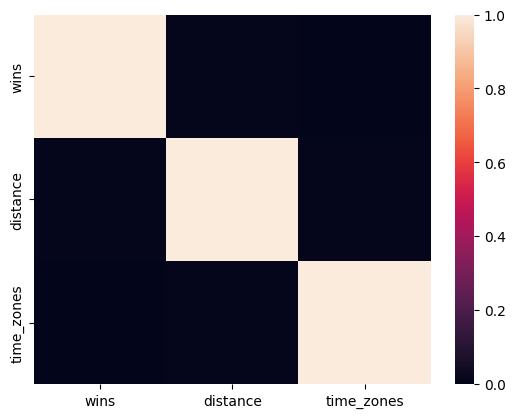

In [ ]:
sns.heatmap(lan_df.corr())

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=251504ea-2703-459e-91f0-9c8eac78db69' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>